In [519]:
import sys
!{sys.executable} -m pip install git+https://github.com/openai/CLIP.git

  Cloning https://github.com/openai/CLIP.git to /tmp/pip-req-build-ham_qtjd
  Running command git clone --filter=blob:none --quiet https://github.com/openai/CLIP.git /tmp/pip-req-build-ham_qtjd
  Resolved https://github.com/openai/CLIP.git to commit a1d071733d7111c9c014f024669f959182114e33
  Preparing metadata (setup.py) ... done
  Created wheel for clip: filename=clip-1.0-py3-none-any.whl size=1369500 sha256=4e51ac492a81e9e48c5ca59be60bf532e03f9b47503c766f02d96432f449a4bb
  Stored in directory: /tmp/pip-ephem-wheel-cache-jeaiz0su/wheels/da/2b/4c/d6691fa9597aac8bb85d2ac13b112deb897d5b50f5ad9a37e4
Successfully built clip


In [14]:
import torch
import clip
device = "cuda" if torch.cuda.is_available() else "cpu"
print(device)
model, preprocess = clip.load("ViT-B/32", device=device)

cuda


In [15]:
import os
import re
import cv2
import csv
import json
import random
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from collections import defaultdict
from langdetect import detect
from iso639 import languages
import plotly.express as px
import plotly.graph_objects as go
import plotly.offline as pyo
from plotly.subplots import make_subplots
import scipy
import math
from PIL import Image

from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn.preprocessing import StandardScaler
from sklearn.neighbors import KNeighborsClassifier
from sklearn.pipeline import Pipeline
from sklearn.metrics import confusion_matrix

# Set notebook mode to work in offline
pyo.init_notebook_mode()

# import seaborn as sns
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator
from tldextract import extract
import matplotlib.cm as cm
  
import urllib.request as urlopen
from textwrap import wrap

# from transformers import pipeline
# import textstat
# import pyLDAvis
# from biterm.cbtm import oBTM 
# from sklearn.feature_extraction.text import CountVectorizer
# from biterm.utility import vec_to_biterms, topic_summuary # helper functions

In [16]:
data_dir = '/data/datacomp/'
scale_dir = os.path.join(data_dir, 'small')
metadata_dir = os.path.join(scale_dir, 'metadata')
# sample_clip_dir = os.path.join(scale_dir, 'face_images_2M_clip_embeddings')
# sample_face_df_path = '~/datafiltering/face_images_2M_single_df.parquet'

# sample_clip_dir = os.path.join(scale_dir, 'face_images_100k_clip_embeddings')
# sample_face_df_path = '~/datafiltering/face_images_100k_single_df.parquet'

sample_clip_dir = os.path.join(scale_dir, 'sample_11k_rekognition_clip_embeddings')
sample_face_df_path = '~/datafiltering/face_rekognition_images_single_df.parquet'


cfd_dir = '/data/CFD/'
cfd_img_dir = os.path.join(cfd_dir, 'data/Images/CFD/')
cfd_clip_dir = os.path.join(cfd_dir, 'CLIP_embeddings')

ETHNICITIES = ['A', 'B', 'L', 'W']
ETHNICITIES_TO_TEXT = {
    'A': 'Asian',
    'B': 'Black',
    'L': 'Latino',
    'W': 'White'
}
GENDERS_TO_TEXT = {
    'M': 'Male',
    'F': 'Female'
}
GENDERS = ['M', 'F']
REKOG_GENDERS = ['Male', 'Female']

GROUPS = ['AM', 'AF', 'BM', 'BF', 'LM', 'LF', 'WM' , 'WF']
print(len(GROUPS))

GROUPS_AS_TEXT = [
    'Asian Male', 'Asian Female',
    'Black Male', 'Black Female',
    'Latino Male', 'Latino Female',
    'White Male', 'White Female'
]

8


In [17]:
sample_face_df = pd.read_parquet(sample_face_df_path).dropna() # downloaded images
sample_face_df

,uid,is_kept,clip_l14_similarity_score,bounding_box,face_detail,img_path
2903,679c52457e754058c79aa0ed53a1f9c2,False,0.134155,"{'Height': 0.07013186812400818, 'Left': 0.5912...","{'AgeRange': {'High': 25, 'Low': 19}, 'Boundin...",/data/datacomp/small/sample_images_1M/679c5245...
3466,7080884b0e5785035f25185394fa0488,False,0.139282,"{'Height': 0.042780742049217224, 'Left': 0.128...","{'AgeRange': {'High': 81, 'Low': 73}, 'Boundin...",/data/datacomp/small/sample_images_1M/7080884b...
3831,e5cd240f4d1ba979a05a1e8ae2f58b46,True,0.282715,"{'Height': 0.053211428225040436, 'Left': 0.425...","{'AgeRange': {'High': 22, 'Low': 14}, 'Boundin...",/data/datacomp/small/sample_images_1M/e5cd240f...
4152,7c56a3785f76c247f12426fd1f1e09cb,False,0.238037,"{'Height': 0.5678257346153259, 'Left': 0.31606...","{'AgeRange': {'High': 41, 'Low': 33}, 'Boundin...",/data/datacomp/small/sample_images_1M/7c56a378...
5526,1c93325f3b1dc161ad4853ccfde59f6b,True,0.389404,"{'Height': 0.12182845920324326, 'Left': 0.6872...","{'AgeRange': {'High': 19, 'Low': 13}, 'Boundin...",/data/datacomp/small/sample_images_1M/1c93325f...
...,...,...,...,...,...,...
12793317,ebcdf840a58b526954acc6c393748577,False,0.213745,"{'Height': 0.2947092354297638, 'Left': 0.31180...","{'AgeRange': {'High': 52, 'Low': 44}, 'Boundin...",/data/datacomp/small/sample_images_1M/ebcdf840...
12795107,f086c387af61525b21afc298bb664972,True,0.253418,"{'Height': 0.5319896936416626, 'Left': 0.24223...","{'AgeRange': {'High': 19, 'Low': 13}, 'Boundin...",/data/datacomp/small/sample_images_1M/f086c387...
12798008,4b178c30fc051300270d98116912c0fe,False,0.181030,"{'Height': 0.13903246819972992, 'Left': 0.2823...","{'AgeRange': {'High': 30, 'Low': 22}, 'Boundin...",/data/datacomp/small/sample_images_1M/4b178c30...
12798943,e2f047278fc517de7c7da42d3690d6fa,True,0.258057,"{'Height': 0.2311783730983734, 'Left': 0.27956...","{'AgeRange': {'High': 29, 'Low': 21}, 'Boundin...",/data/datacomp/small/sample_images_1M/e2f04727...


In [18]:
filtered_uids = set(sample_face_df[sample_face_df['is_kept'] == True]['uid'].unique())
len(filtered_uids)

2985

In [19]:
uid_to_img_path = {}
uid_to_face_bbox = {}
uid_to_score = {}
for _, row in sample_face_df.iterrows():
    uid = row['uid']
    uid_to_img_path[uid] = row['img_path']
    uid_to_face_bbox[uid] = row['bounding_box'] # row['face_bboxes'][0]
#     assert(len(row['face_bboxes']) == 1)
    uid_to_score[uid] = row['clip_l14_similarity_score']

In [20]:
# cfd embeddings

embeddings_by_id = defaultdict(list)
user_id_to_img_path = defaultdict(list)

for f in os.listdir(cfd_clip_dir):
    name = f.split('.')[0]
    if name.startswith('CFD'):
        user_id = '-'.join(name.split('-')[1:3])
        print(user_id)
        embedding_pt = os.path.join(cfd_clip_dir, f)
        embedding = torch.load(embedding_pt).detach().cpu().numpy()
        embeddings_by_id[user_id].append(embedding)
        
        img_path = os.path.join(cfd_img_dir, user_id, name + '.jpg')
        user_id_to_img_path[user_id].append(img_path)


AF-214
LM-229
WF-036
WF-003
BM-024
WF-008
WF-006
WF-006
WM-021
WM-218
WF-016
WF-231
AF-253
WM-026
BM-003
BM-036
WM-040
BM-023
BM-013
WM-025
WM-254
LM-211
WF-015
LF-241
BM-043
BM-030
WF-016
BF-001
AF-212
AF-204
BF-043
BF-008
WF-027
WM-017
WF-006
WF-035
WF-010
BF-002
WM-011
WM-235
LM-231
BM-034
BF-047
BF-233
WM-019
WM-229
WF-020
WF-009
BF-039
BF-209
BF-033
BF-030
BF-017
BM-243
WM-017
WM-019
WM-032
WM-236
LM-217
WM-014
WM-001
LF-202
BF-007
WM-200
WF-034
BF-218
BM-045
WF-038
BM-211
BF-036
WM-003
WF-014
WM-020
AM-241
BF-042
AM-252
BM-019
WM-010
WM-009
BM-249
LF-238
BM-001
WF-003
BF-027
BM-013
BM-046
WF-020
BF-050
WF-029
WF-021
WM-006
WM-033
LF-244
BF-226
BF-245
AF-213
WF-031
LF-254
WF-038
BF-048
WF-251
BF-050
WF-033
BF-017
BF-040
WF-202
WM-033
LM-248
AM-218
BM-041
AF-231
BM-045
BM-248
BM-033
BF-018
WF-026
WM-230
BF-037
BF-019
AF-215
WM-036
BM-011
WF-002
LM-250
WF-203
BM-028
BF-011
AF-221
WM-036
BM-231
AF-235
BF-018
BM-045
WF-038
WM-014
LF-215
AM-210
LM-234
AM-236
AM-226
BF-031
BF-012
WF-017

# Dimensionality reduction

In [21]:
colors = {
    'A': 'r',
    'B': 'g',
    'L': 'b',
    'W': 'y'
}
markers = {
    'F': 'o',
    'M': 'v'
}


In [22]:
final_user_ids = []
final_embeddings = [] # 'AF' --> []
final_groups = []
final_img_paths = []
random.seed(0)
for user_id in embeddings_by_id:
    user_embeddings = embeddings_by_id[user_id]
    random_i = random.sample(range(len(user_embeddings)), 1)[0]
    final_embeddings.append(user_embeddings[random_i])
    final_img_paths.append(user_id_to_img_path[user_id][random_i])
    final_groups.append(user_id.split('-')[0])
    final_user_ids.append(user_id)
final_embeddings = np.reshape(final_embeddings, (len(final_embeddings), 512))
final_embeddings.shape

(597, 512)

In [23]:
# text embeddings

text_embeddings = []
text_groups = []
for g in GROUPS_AS_TEXT:
    text = 'a photo of a' + ('n ' if g.startswith('A') else ' ') + g.lower()
    print(text)
    tokens = clip.tokenize([text]).to(device)
    text_features = model.encode_text(tokens)[0]
    embedding = text_features.detach().cpu().numpy()
    text_embeddings.append(embedding)
    text_groups.append(g)

np.concatenate((final_embeddings, text_embeddings)).shape

a photo of an asian male
a photo of an asian female
a photo of a black male
a photo of a black female
a photo of a latino male
a photo of a latino female
a photo of a white male
a photo of a white female


(605, 512)

In [33]:
pca = PCA(n_components=2)
raw_x = np.concatenate((final_embeddings, text_embeddings))
pca_scaler = StandardScaler().fit(final_embeddings) # (raw_x)

x = pca_scaler.transform(final_embeddings) # (raw_x)
principalComponents = pca.fit_transform(x)
principalDf = pd.DataFrame(data = principalComponents
             , columns = ['principal component 1', 'principal component 2'])

principalDf = principalDf.assign(
    group=final_groups, # + [None] * len(text_embeddings),
    ethnicity=[v[0] for v in final_groups], # + [None] * len(text_embeddings),
    gender=[v[0] for v in final_groups], # + [None] * len(text_embeddings),
#     text_group=[None] * len(final_groups) + text_groups
)

pca.explained_variance_ratio_

array([0.10488454, 0.08614012])

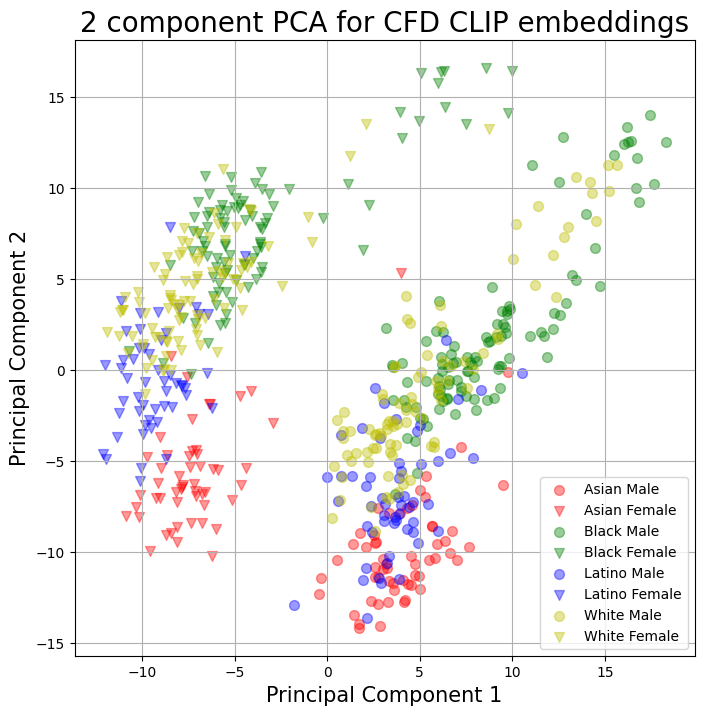

In [39]:
fig = plt.figure(figsize = (8,8))
ax = fig.add_subplot(1,1,1) 
ax.set_xlabel('Principal Component 1', fontsize = 15)
ax.set_ylabel('Principal Component 2', fontsize = 15)
ax.set_title('2 component PCA for CFD CLIP embeddings', fontsize = 20)

targets = sorted(list(set(final_groups)))

for i, target in enumerate(targets):
    indicesToKeep = principalDf['group'] == target
    ax.scatter(principalDf.loc[indicesToKeep, 'principal component 1']
               , principalDf.loc[indicesToKeep, 'principal component 2']
               , c = colors[target[0]]
               , marker = markers[target[1]]
               , s = 50
               , alpha = 0.4
    )

# for i in range(len(text_groups)):
#     g = text_groups[i]
#     indicesToKeep = principalDf['text_group'] == g
#     ax.scatter(principalDf.loc[indicesToKeep, 'principal component 1']
#                , principalDf.loc[indicesToKeep, 'principal component 2']
#                , c = colors[g.split(' ')[0][0]]
#                , marker = markers[g.split(' ')[1][0]]
#                , s = 50
#     )
#     ax.text(
#         principalDf.loc[indicesToKeep, 'principal component 1'],
#         principalDf.loc[indicesToKeep, 'principal component 2'],
#         'a photo of a' + ('n ' if g.startswith('A') else ' ') + g.lower()
#     )

ax.legend([GROUPS_AS_TEXT[i] for i, _ in enumerate(targets)])
ax.grid()
plt.show()

In [35]:
tsne = TSNE(n_components=2, verbose=1, perplexity=40, n_iter=300)
raw_x = np.concatenate((final_embeddings, text_embeddings))
tsne_scaler = StandardScaler().fit(final_embeddings) # (raw_x)
x = tsne_scaler.transform(final_embeddings) # (raw_x)
tsne_results = tsne.fit_transform(x)

tsneDf = pd.DataFrame(data = tsne_results
             , columns = ['tsne 1', 'tsne 2'])
tsneDf = tsneDf.assign(
    group=final_groups, # + [None] * len(text_embeddings),
    ethnicity=[v[0] for v in final_groups], # + [None] * len(text_embeddings),
    gender=[v[0] for v in final_groups], # + [None] * len(text_embeddings),
#     text_group=[None] * len(final_groups) + text_groups
)

/home/hongrach/anaconda3/envs/datacomp/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning:

The default initialization in TSNE will change from 'random' to 'pca' in 1.2.

/home/hongrach/anaconda3/envs/datacomp/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning:

The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.



[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 597 samples in 0.000s...
[t-SNE] Computed neighbors for 597 samples in 0.027s...
[t-SNE] Computed conditional probabilities for sample 597 / 597
[t-SNE] Mean sigma: 9.234035
[t-SNE] KL divergence after 250 iterations with early exaggeration: 69.262146
[t-SNE] KL divergence after 300 iterations: 0.867983


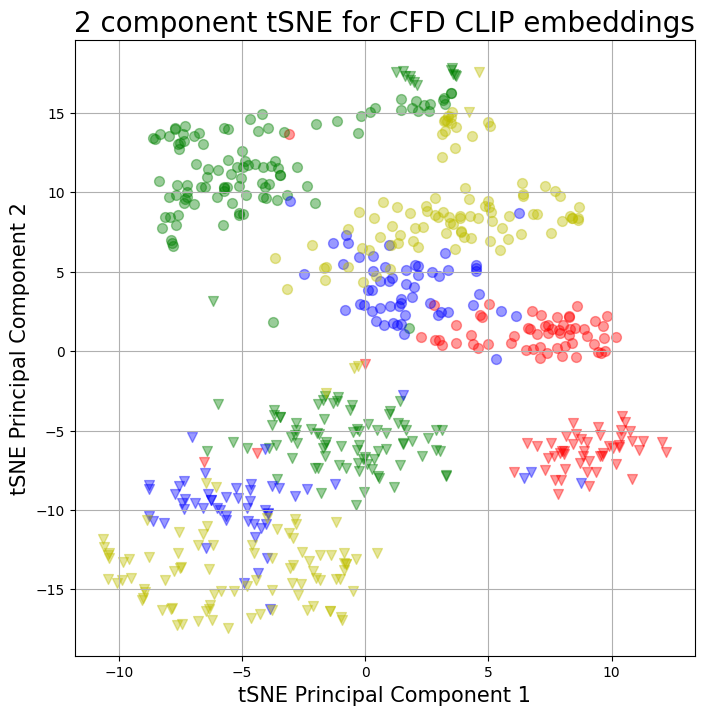

In [41]:
fig = plt.figure(figsize = (8,8))
ax = fig.add_subplot(1,1,1) 
ax.set_xlabel('tSNE Principal Component 1', fontsize = 15)
ax.set_ylabel('tSNE Principal Component 2', fontsize = 15)
ax.set_title('2 component tSNE for CFD CLIP embeddings', fontsize = 20)

targets = sorted(list(set(final_groups)))
colors = {
    'A': 'r',
    'B': 'g',
    'L': 'b',
    'W': 'y'
}
markers = {
    'F': 'o',
    'M': 'v'
}

for i, target in enumerate(targets):
    indicesToKeep = tsneDf['group'] == target
    ax.scatter(tsneDf.loc[indicesToKeep, 'tsne 1']
               , tsneDf.loc[indicesToKeep, 'tsne 2']
               , c = colors[target[0]]
               , marker = markers[target[1]]
               , s = 50
               , alpha = 0.4
    )

# for i in range(len(text_groups)):
#     g = text_groups[i]
#     indicesToKeep = tsneDf['text_group'] == g
#     ax.scatter(tsneDf.loc[indicesToKeep, 'tsne 1']
#                , tsneDf.loc[indicesToKeep, 'tsne 2']
#                , c = colors[g.split(' ')[0][0]]
#                , marker = markers[g.split(' ')[1][0]]
#                , s = 50
#     )
#     ax.text(
#         tsneDf.loc[indicesToKeep, 'tsne 1'],
#         tsneDf.loc[indicesToKeep, 'tsne 2'],
#         'a photo of a' + ('n ' if g.startswith('A') else ' ') + g.lower()
#     )

# ax.legend([GROUPS_AS_TEXT[i] for i, _ in enumerate(targets)])
ax.grid()
plt.show()

# kNN on datacomp images

In [15]:
def onehot(i, groups=ETHNICITIES):
    arr = [0] * len(groups)
    arr[i] = 1
    return arr

In [16]:
# rekognition gender labels

def get_gender_by_row(row):
    gender = row['face_detail']['Gender']['Value']
    return gender

uid_to_gender = {}
for _, row in sample_face_df.iterrows():
    uid_to_gender[row['uid']] = get_gender_by_row(row)

In [17]:
datacomp_embeddings_by_uid = {}

for i, f in enumerate(os.listdir(sample_clip_dir)):
    uid = f.split('.')[0]
    if uid not in datacomp_embeddings_by_uid:
        if i % 100 == 0:
            print(i)
        embedding_pt = os.path.join(sample_clip_dir, f)
        embedding = torch.load(embedding_pt).detach().cpu().numpy()
        datacomp_embeddings_by_uid[uid] = embedding
print(len(datacomp_embeddings_by_uid.keys()))

0
100
200
300
400
500
600
700
800
900
1000
1100
1200
1300
1400
1500
1600
1700
1800
1900
2000
2100
2200
2300
2400
2500
2600
2700
2800
2900
3000
3100
3200
3300
3400
3500
3600
3700
3800
3900
4000
4100
4200
4300
4400
4500
4600
4700
4800
4900
5000
5100
5200
5300
5400
5500
5600
5700
5800
5900
6000
6100
6200
6300
6400
6500
6600
6700
6800
6900
7000
7100
7200
7300
7400
7500
7600
7700
7800
7900
8000
8100
8200
8300
8400
8500
8600
8700
8800
8900
9000
9100
9200
9300
9400
9500
9600
9700
9800
9900
10000
10100
10200
10300
10400
10500
10600
10700
10800
10900
11000
11032


In [18]:
len(datacomp_embeddings_by_uid)

11032

In [45]:
# np.save('/data/datacomp/small/face_images_2M_clip_embeddings.npy',  datacomp_embeddings_by_uid)  
datacomp_embeddings_by_uid = np.load('/data/datacomp/small/face_images_2M_clip_embeddings.npy', allow_pickle=True)
datacomp_embeddings_by_uid = datacomp_embeddings_by_uid[()]
len(datacomp_embeddings_by_uid)

957486

In [19]:
datacomp_uids = []
datacomp_embeddings = []
for uid in datacomp_embeddings_by_uid:
    datacomp_uids.append(uid)
    datacomp_embeddings.append(datacomp_embeddings_by_uid[uid])

n = len(datacomp_embeddings)
random.seed(0)
sample_indices = random.sample(range(len(datacomp_embeddings)), n)
datacomp_embeddings_sample = np.reshape(
    np.asarray(datacomp_embeddings)[sample_indices], (len(sample_indices), 512)
)
datacomp_uids_sample = np.asarray(datacomp_uids)[sample_indices]
datacomp_uids_sample.shape, datacomp_embeddings_sample.shape

((11032,), (11032, 512))

In [138]:
def get_face_img_size(uid, opencv=True):
    raw_img = cv2.imread(uid_to_img_path[uid])
    if raw_img is None:
        print('img not found', uid_to_img_path[uid])
        return 0

    (w1, h1, w2, h2) = get_face_box(raw_img, uid_to_face_bbox[uid], opencv=opencv)
    return (w2 - w1) * (h2 - h1)

img_size = [get_face_img_size(uid, opencv=False) for uid in datacomp_uids_sample]


libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng 

In [142]:
MIN_SQ_PIXEL = 900

img_size_mask = [s > MIN_SQ_PIXEL for s in img_size]
len(np.asarray(img_size_mask)), len(np.asarray(img_size_mask)[img_size_mask])

(11032, 7783)

In [20]:
# validation set from cfd
final_group_to_is = defaultdict(list) # 'AF' -> []
for i in range(len(final_user_ids)):
    g = final_groups[i]
    final_group_to_is[g].append(i)

VALID_SAMPLE = 20
random.seed(1)
valid_is = []
for g in final_group_to_is:
    valid_is += random.sample(final_group_to_is[g], VALID_SAMPLE)

valid_user_ids = np.asarray(final_user_ids)[valid_is]
valid_embeddings = final_embeddings[valid_is, :]
valid_groups = np.asarray(final_groups)[valid_is]
valid_img_paths = np.asarray(final_img_paths)[valid_is]

train_user_ids = np.delete(np.asarray(final_user_ids), [valid_is])
train_embeddings = np.delete(final_embeddings, [valid_is], 0)
train_groups = np.delete(np.asarray(final_groups), [valid_is])
train_img_paths = np.delete(np.asarray(final_img_paths), [valid_is])

print(final_embeddings.shape, train_embeddings.shape, valid_embeddings.shape)
assert(set(train_user_ids).intersection(set(valid_user_ids)) == set())

(597, 512) (437, 512) (160, 512)


In [21]:
# gender classifier

y_gender = [[1, 0] if g[1] == GENDERS[0] else [0, 1] for g in train_groups]
y_gender = np.asarray(y_gender)

gender_clf = Pipeline(
    steps=[
#         ("scaler", StandardScaler()),
        ("knn", KNeighborsClassifier(n_neighbors=7))
    ]
)

weights = "distance" # "distance" not as good
gender_clf.set_params(knn__weights=weights).fit(train_embeddings, y_gender)

Pipeline(steps=[('knn',
                 KNeighborsClassifier(n_neighbors=7, weights='distance'))])

In [22]:
# gender predict
gender_y_hat_prob = gender_clf.predict_proba(datacomp_embeddings_sample)
gender_y_hat = gender_clf.predict(datacomp_embeddings_sample)
gender_y_hat_prob = gender_y_hat_prob[1]

confidence_mask = [max(row) > 0.95 for row in gender_y_hat_prob]
print(len(gender_y_hat[confidence_mask]))

# print(len(gender_y_hat[np.asarray(img_size_mask) & np.asarray(confidence_mask)]))

len(gender_y_hat), gender_y_hat.shape

5514


(11032, (11032, 2))

In [23]:
# gender validation
valid_gender_y_hat_prob = gender_clf.predict_proba(valid_embeddings)
valid_gender_y_hat = gender_clf.predict(valid_embeddings)
valid_gender_y_hat_prob = gender_y_hat_prob[1]

valid_y_gender = [[1, 0] if g[1] == GENDERS[0] else [0, 1] for g in valid_groups]
valid_y_gender = np.asarray(valid_y_gender)

eq = valid_gender_y_hat[:, 1] == valid_y_gender[:, 1]
print(len(eq[eq]) / len(eq))
valid_conf_mat = confusion_matrix(valid_gender_y_hat[:, 1], valid_y_gender[:, 1])
valid_acc = np.sum(valid_conf_mat.diagonal()) / np.sum(valid_conf_mat)
print('Overall accuracy: {} %'.format(valid_acc*100))

for g in final_group_to_is:
    g_mask = (valid_groups == g)
    g_valid_conf_mat = confusion_matrix(valid_gender_y_hat[g_mask][:, 1], valid_y_gender[g_mask][:, 1])
    g_valid_acc = np.sum(g_valid_conf_mat.diagonal()) / np.sum(g_valid_conf_mat)
    print('{}: {}%'.format(g, g_valid_acc*100))

1.0
Overall accuracy: 100.0 %
AF: 100.0%
LM: 100.0%
WF: 100.0%
BM: 100.0%
WM: 100.0%
LF: 100.0%
BF: 100.0%
AM: 100.0%


In [24]:
gender_y_rekog = []
for i in range(len(datacomp_uids_sample)):
    uid = datacomp_uids_sample[i]
    gender_y_rekog.append([1, 0] if uid_to_gender[uid] == REKOG_GENDERS[0] else [0, 1])
gender_y_rekog = np.asarray(gender_y_rekog)
gender_y_rekog.shape

gender_conf_mask = [max(row) > 0.95 for row in gender_y_hat_prob]
print('num under threshold', len(gender_y_hat[gender_conf_mask]))

conf_mat = confusion_matrix(gender_y_hat[gender_conf_mask, 1], gender_y_rekog[gender_conf_mask, 1])
acc = np.sum(conf_mat.diagonal()) / np.sum(conf_mat)
print('# disagree', np.sum(conf_mat) - np.sum(conf_mat.diagonal()))
print('Overall accuracy: {} %'.format(acc*100))

conf_mat = confusion_matrix(gender_y_hat[:, 1], gender_y_rekog[:, 1])
acc = np.sum(conf_mat.diagonal()) / np.sum(conf_mat)
print('Overall accuracy: {} %'.format(acc*100))

num under threshold 5514
# disagree 254
Overall accuracy: 95.39354370692782 %
Overall accuracy: 81.13669325598259 %


In [25]:
# ethnicity classifier
y_eth = [onehot(ETHNICITIES.index(g[0])) for g in train_groups]
y_eth = np.asarray(y_eth)


ethnicity_clf = Pipeline(
    steps=[
#         ("scaler", StandardScaler()),
        ("knn", KNeighborsClassifier(n_neighbors=5))
    ]
)

weights = "uniform" # "distance" unclear if better to account for
ethnicity_clf.set_params(knn__weights=weights).fit(train_embeddings, y_eth)

Pipeline(steps=[('knn', KNeighborsClassifier())])

In [26]:
# ethnicity predict
eth_y_hat_prob = ethnicity_clf.predict_proba(datacomp_embeddings_sample)
eth_y_hat = ethnicity_clf.predict(datacomp_embeddings_sample)
eth_y_hat_prob = np.asarray(eth_y_hat_prob)[:,:,1].transpose()

eth_confidence_mask = [max(row) > 0.25 for row in eth_y_hat_prob]
print(len(eth_y_hat[eth_confidence_mask]))
# print(len(eth_y_hat[np.asarray(img_size_mask) & np.asarray(eth_confidence_mask)]))

len(eth_y_hat_prob), eth_y_hat.shape

11032


(11032, (11032, 4))

In [27]:
# ethnicity validation
valid_eth_y_hat_prob = gender_clf.predict_proba(valid_embeddings)
valid_eth_y_hat_prob = np.asarray(valid_eth_y_hat_prob)[:,:,1].transpose()

valid_eth_y_hat = ethnicity_clf.predict(valid_embeddings)
valid_y_eth = [onehot(ETHNICITIES.index(g[0])) for g in valid_groups]
valid_y_eth = np.asarray(valid_y_eth)

valid_eth_acc = (valid_eth_y_hat * valid_y_eth).sum() / len(valid_y_eth)
print('Overall accuracy: {} %'.format(valid_eth_acc*100))

for g in final_group_to_is:
    g_mask = (valid_groups == g)
    g_valid_eth_acc = (valid_eth_y_hat[g_mask] * valid_y_eth[g_mask]).sum() / len(valid_y_eth[g_mask])
    print('{}: {}%'.format(g, g_valid_eth_acc*100))

Overall accuracy: 90.625 %
AF: 95.0%
LM: 85.0%
WF: 95.0%
BM: 95.0%
WM: 100.0%
LF: 65.0%
BF: 95.0%
AM: 95.0%


In [28]:
valid_eth_conf_mask = [max(row) > 0.95 for row in valid_eth_y_hat_prob]
print(len(valid_eth_y_hat_prob[valid_eth_conf_mask]))

valid_eth_acc = (valid_eth_y_hat[valid_eth_conf_mask] * valid_y_eth[valid_eth_conf_mask]).sum() / len(valid_y_eth)
print('Overall accuracy: {} %'.format(valid_eth_acc*100))

for g in final_group_to_is:
    g_mask = ((valid_groups == g) & valid_eth_conf_mask)
    g_valid_eth_acc = (valid_eth_y_hat[g_mask] * valid_y_eth[g_mask]).sum() / len(valid_y_eth[g_mask])
    print('{}: {}%'.format(g, g_valid_eth_acc*100))

159
Overall accuracy: 90.625 %
AF: 95.0%
LM: 85.0%
WF: 95.0%
BM: 95.0%
WM: 100.0%
LF: 65.0%
BF: 95.0%
AM: 100.0%


## ethnicity-gender

In [496]:
# ethnicity-gender classifier
y_g = [onehot(GROUPS.index(g[0] + g[1]), groups=GROUPS) for g in train_groups]
y_g = np.asarray(y_g)
print(y_g.shape)

g_clf = Pipeline(
    steps=[
#         ("scaler", StandardScaler()),
        ("knn", KNeighborsClassifier(n_neighbors=9, metric='cosine'))
    ]
)

weights = "uniform" # "distance" unclear if better to account for
g_clf.set_params(knn__weights=weights).fit(train_embeddings, y_g)

(437, 8)


Pipeline(steps=[('knn', KNeighborsClassifier(metric='cosine', n_neighbors=9))])

In [497]:
# ethnicity-gender predict
g_y_hat_prob = g_clf.predict_proba(datacomp_embeddings_sample)
g_y_hat_prob = np.asarray(g_y_hat_prob)[:,:,1].transpose()

g_y_hat = g_clf.predict(datacomp_embeddings_sample)

g_confidence_mask = [max(row) > 0.9 for row in g_y_hat_prob]
print(len(g_y_hat[g_confidence_mask]))

len(g_y_hat_prob), g_y_hat.shape

87366


(957486, (957486, 8))

In [504]:
g_y_hat.shape

(957486, 8)

In [498]:
# ethnicity-gender validation
valid_g_y_hat_prob = g_clf.predict_proba(valid_embeddings)
valid_g_y_hat_prob = np.asarray(valid_g_y_hat_prob)[:,:,1].transpose()

valid_g_y_hat = g_clf.predict(valid_embeddings)
valid_y_g = [onehot(GROUPS.index(g[0] + g[1]), groups=GROUPS) for g in valid_groups]
valid_y_g = np.asarray(valid_y_g)

valid_g_acc = (valid_g_y_hat * valid_y_g).sum() / len(valid_y_g)
print('Overall accuracy: {} %'.format(valid_g_acc*100))

for g in final_group_to_is:
    g_mask = (valid_groups == g)
    g_valid_acc = (valid_g_y_hat[g_mask] * valid_y_g[g_mask]).sum() / len(valid_y_g[g_mask])
    print('{}: {}%'.format(g, g_valid_acc*100))
    
# vary confidence threshold
valid_g_conf_mask = [max(row) > 0.9 for row in valid_g_y_hat_prob]
print(len(valid_g_y_hat_prob[valid_g_conf_mask]))

valid_g_acc = (valid_g_y_hat[valid_g_conf_mask] * valid_y_g[valid_g_conf_mask]).sum() / len(valid_y_g[valid_g_conf_mask])
print('Overall accuracy: {} %'.format(valid_g_acc*100))

for g in final_group_to_is:
    g_mask = ((valid_groups == g) & valid_g_conf_mask)
    g_valid_acc = (valid_g_y_hat[g_mask] * valid_y_g[g_mask]).sum() / len(valid_y_g[g_mask])
    print('{}: {}%'.format(g, g_valid_acc*100))

Overall accuracy: 88.75 %
AF: 95.0%
LM: 80.0%
WF: 90.0%
BM: 95.0%
WM: 100.0%
LF: 60.0%
BF: 95.0%
AM: 95.0%
78
Overall accuracy: 100.0 %
AF: 100.0%
LM: 100.0%
WF: 100.0%
BM: 100.0%
WM: 100.0%
LF: 100.0%
BF: 100.0%
AM: 100.0%


In [442]:
gender_y_rekog = []
for i in range(len(datacomp_uids_sample)):
    uid = datacomp_uids_sample[i]
    gender_y_rekog.append([1, 0] if uid_to_gender[uid] == REKOG_GENDERS[0] else [0, 1])
gender_y_rekog = np.asarray(gender_y_rekog)
gender_y_rekog.shape

g_gender_y_hat = []
for y_hat in g_y_hat:
    gender = GROUPS[np.argmax(y_hat)][1]
    l = onehot(GENDERS.index(gender), groups=GENDERS)
    g_gender_y_hat.append(l)
g_gender_y_hat = np.asarray(g_gender_y_hat)

# vary confidence threshold
g_conf_mask = [max(row) > 0.9 for row in g_y_hat_prob]
print('num under threshold', len(g_gender_y_hat[g_conf_mask]))

conf_mat = confusion_matrix(g_gender_y_hat[g_conf_mask, 1], gender_y_rekog[g_conf_mask, 1])
acc = np.sum(conf_mat.diagonal()) / np.sum(conf_mat)
print('# disagree', np.sum(conf_mat) - np.sum(conf_mat.diagonal()))
print('Overall accuracy: {} %'.format(acc*100))

# .125 threshold
conf_mat = confusion_matrix(g_gender_y_hat[:, 1], gender_y_rekog[:, 1])
acc = np.sum(conf_mat.diagonal()) / np.sum(conf_mat)
print('Overall accuracy: {} %'.format(acc*100))

num under threshold 915
# disagree 16
Overall accuracy: 98.25136612021858 %
Overall accuracy: 79.02465554749818 %


## Visualize CFD neighbors

In [356]:
def get_face_box(img, box, opencv=False):
    h = int(img.shape[0])
    w = int(img.shape[1])
    if opencv:
        assert(len(box) >= 4)
        w1 = int(box[0] * w)
        h1 = int(box[1] * h)
        w2 = int(box[2] * w)
        h2 = int(box[3] * h)
    else:
        w1 = int(box['Left'] * w)
        h1 = int(box['Top'] * h)
        w2 = int((box['Left'] + box['Width']) * w)
        h2 = int((box['Top'] + box['Height']) * h)
    return (w1, h1, w2, h2)


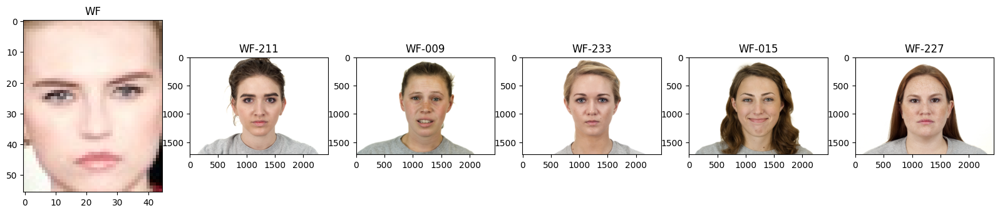

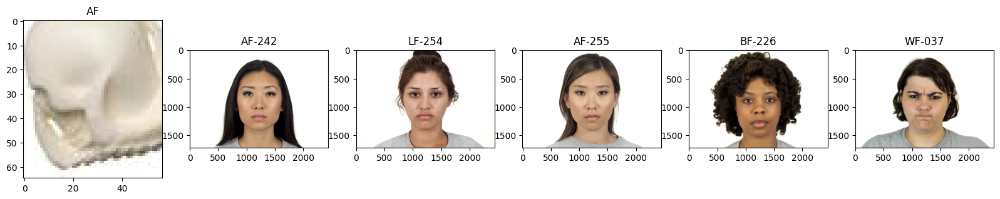

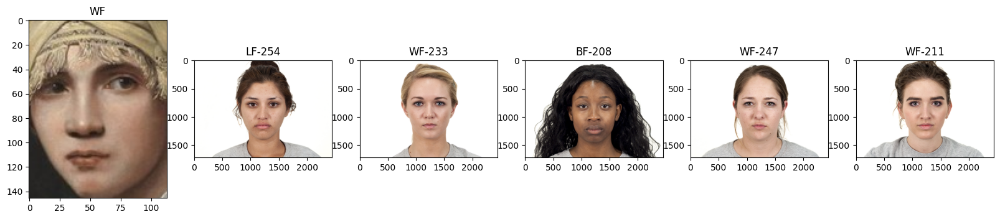

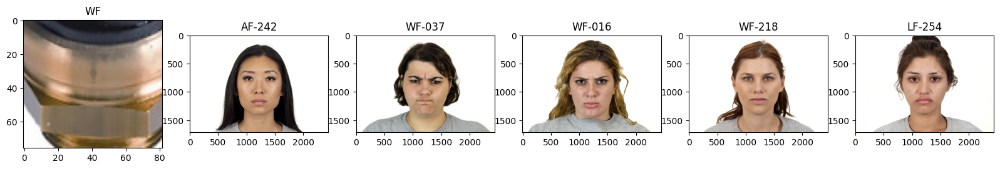

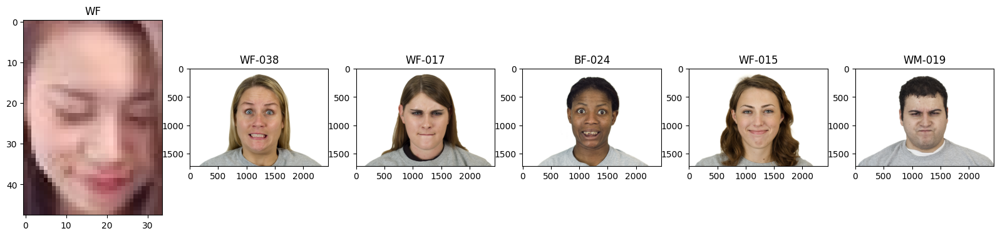

...

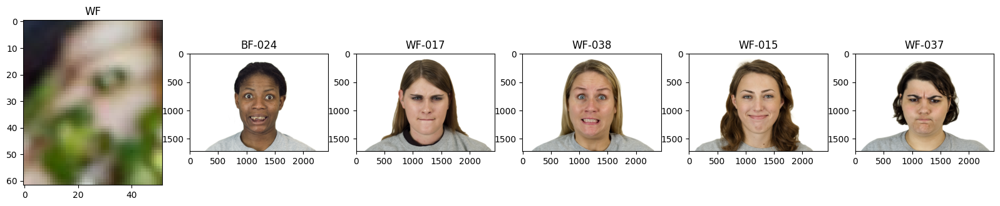

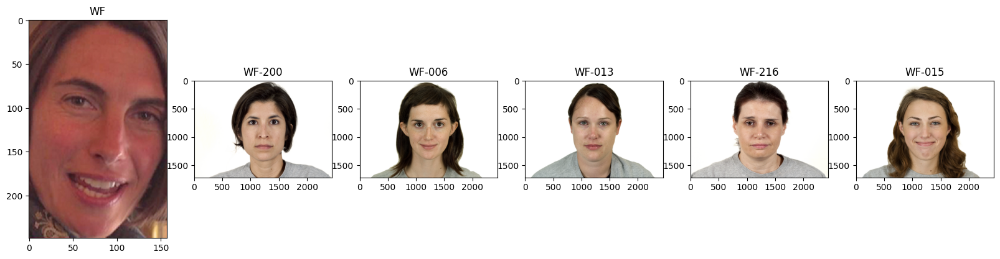

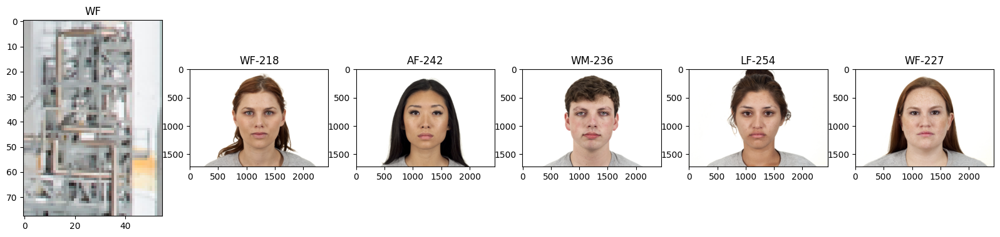

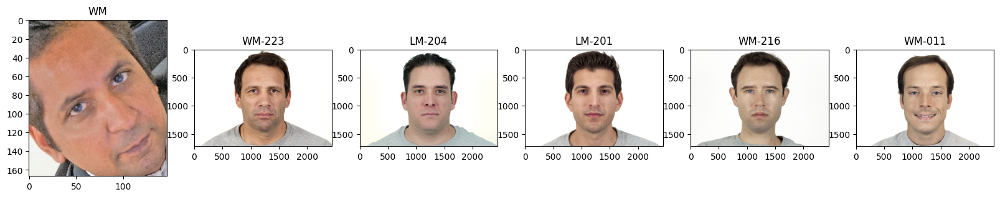

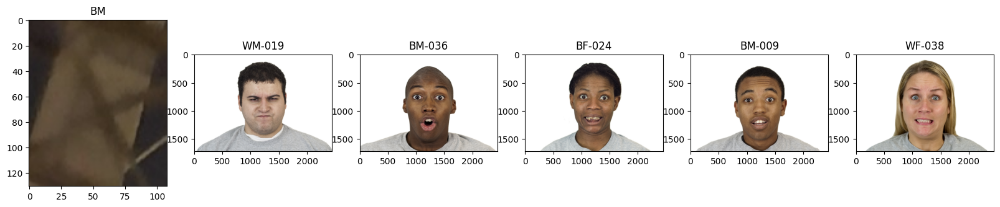

In [ ]:
# 11 / 100 not faces using datacomp detection [above CLIP knn threshold score]
# 1 / 100 not faces using rekog detection [above CLIP knn threshold score]

# X / 100 not faces using datacomp detection [w/o CLIP knn threshold score]
# 11 / 100 not faces using rekog detection [w/o CLIP knn threshold score]


confidence_is = np.asarray(range(len(datacomp_uids_sample))) # [confidence_mask]
view_n = 100
view_sample_is = random.sample(list(confidence_is), view_n)
SHOW_REKOG = False

count = 0
for datacomp_i in view_sample_is:
    uid = datacomp_uids_sample[datacomp_i]
    row = sample_face_df[sample_face_df['uid'] == uid].iloc[0]
    img_path = row['img_path']
    raw_img = cv2.imread(img_path)

    (w1, h1, w2, h2) = get_face_box(
        raw_img,
        row['bounding_box'] if SHOW_REKOG else row['face_bboxes'][0],
        opencv=not SHOW_REKOG
    )

    final_h1 = max(0, h1)
    final_h2 = min(h2, raw_img.shape[0]-1)
    final_w1 = max(0, w1)
    final_w2 = min(w2, raw_img.shape[1]-1)
    face_img = raw_img[final_h1: final_h2, final_w1: final_w2]
    
#     if not eth_confidence_mask[datacomp_i]:
#         continue

#     eg = GROUPS[np.argmax(g_y_hat[datacomp_i])]
#     e = eg[0]
#     g = eg[1]
    e = ETHNICITIES[np.argmax(eth_y_hat[datacomp_i])]
    g = GENDERS[np.argmax(gender_y_hat[datacomp_i])]
    g_rekog = GENDERS[np.argmax(gender_y_rekog[datacomp_i])] if SHOW_REKOG else None
    
#     if SHOW_REKOG and g == g_rekog:
#         continue
    
    fig, axes = plt.subplots(1, 6, figsize=(20, 6))
    ax = axes[0]
    ax.imshow(face_img[:,:,::-1])
    rekog_str = ' (rekog ' +  g_rekog + ')' if SHOW_REKOG else ''
    ax.set_title(
        e + g + rekog_str
    )
    
    embedding = datacomp_embeddings_sample[datacomp_i]
#     gender_embedding = gender_clf[0].transform([embedding])
    _, neigh_ind = gender_clf[-1].kneighbors([embedding], n_neighbors=5)
    for i_ax, i_cfd in enumerate(neigh_ind[0]):
        user_id = train_user_ids[i_cfd]
        cfd_img_path = train_img_paths[i_cfd]
        cfd_img = cv2.imread(cfd_img_path)
        ax = axes[i_ax + 1]
        ax.imshow(cfd_img[:,:,::-1])
        ax.set_title(user_id)
    plt.show()
    count += 1
print(count)

In [75]:
final_user_ids[0]

'AF-214'

# Filter count

In [29]:
uid_to_annotations = {}

gender_count = {'M': {'filtered': [], 'total': []}, 'F': {'filtered': [], 'total': []}}
# {'Male': {'filtered': X, 'total': X}, 'Female': {'filtered': X, 'total': X}}

ethnicity_count = {} # {'decade': {'filtered': X, 'total': X}}
for e in ETHNICITIES:
    ethnicity_count[e] = {'filtered': [], 'total': []}
    
ethnicity_gender_count = {} # {'(X, X)': {'filtered': X, 'total': X}}
for g in GENDERS:
    for e in ETHNICITIES:
        k = e + g
        ethnicity_gender_count[k] = {'filtered': [], 'total': []}

for i, uid in enumerate(datacomp_uids_sample):
#     row = sample_face_df[sample_face_df['uid'] == uid].iloc[0]
    is_filtered = uid in filtered_uids # row['is_kept']
    
    if (confidence_mask[i] or eth_confidence_mask[i]): # and img_size_mask[i]
#         face_img_size = get_face_img_size(uid)
#         if face_img_size <= MIN_SQ_PIXEL:
#             continue

#         eg = GROUPS[np.argmax(g_y_hat_prob[i])]
#         e = eg[0]
#         g = eg[1]
        
        e = ETHNICITIES[np.argmax(eth_y_hat_prob[i])] if eth_confidence_mask[i] else None
        g = GENDERS[np.argmax(gender_y_hat_prob[i])] if confidence_mask[i] else None
        
        uid_to_annotations[uid] = (e, g)
        
        if g != None:
            gender_count[g]['total'].append(uid)
            if is_filtered:
                gender_count[g]['filtered'].append(uid)
        
        if e != None:
            ethnicity_count[e]['total'].append(uid)
            if is_filtered:
                ethnicity_count[e]['filtered'].append(uid)

        if g != None and e != None:
            k = e + g
            ethnicity_gender_count[k]['total'].append(uid)
            if is_filtered:
                ethnicity_gender_count[k]['filtered'].append(uid)

In [30]:
len(uid_to_annotations)

11032

In [ ]:
# dump dicts
annotations = {
    'ethnicity': ethnicity_count,
    'gender': gender_count,
    'ethnicity_gender': ethnicity_gender_count,
    'uid_to_annotations': uid_to_annotations,
}
with open('clip_groups_face_1M_eg.json', 'w') as fp:
    json.dump(annotations, fp)

In [195]:
# read dicts
f = open('clip_groups_face_1M.json')
annotations = json.load(f)
ethnicity_count = annotations['ethnicity']
gender_count = annotations['gender']
ethnicity_gender_count = annotations['ethnicity_gender']
uid_to_annotations = annotations['uid_to_annotations']

In [31]:
def get_error(filter_num, raw_num):
    pos_list = [1] * filter_num
    neg_list = [0] * (raw_num - filter_num)
    err = np.std(pos_list + neg_list)
    return err / np.sqrt(raw_num)

combined_count = {
    'gender': gender_count,
    'ethnicity': ethnicity_count,
    'ethnicity_gender': ethnicity_gender_count
}

M 0.00806684799062375
F 0.008744527053873019


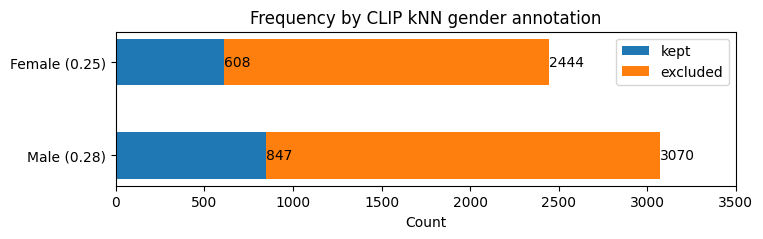

In [83]:
# bar graph: GENDER

graph_results = defaultdict(list)

ratio_by_g = {}
for g in GENDERS:
    filter_num = len(gender_count[g]['filtered'])
    total_num = len(gender_count[g]['total'])
    print(g, get_error(filter_num, total_num))
    ratio_by_g[g] = 1.0 * filter_num / total_num
    graph_results['kept'].append(len(gender_count[g]['filtered']))
    graph_results['excluded'].append(total_num - len(gender_count[g]['filtered']))

x = np.arange(len(GENDERS))  # the label locations
width = 0.5  # the width of the bars

fig, ax = plt.subplots(figsize=(8, 2))
bottom = np.zeros(len(x))

for k, v in graph_results.items():
    offset = width * multiplier
    rects = ax.barh(x + width/2, v, height=width, label=k, left=bottom)
    ax.bar_label(rects) # , padding=-24)
    bottom += v

# Add some text for labels, title and custom x-axis tick labels, etc.
ax.set_xlabel('Count')
ax.set_xlim(0, 3500)
ax.set_title('Frequency by CLIP kNN gender annotation')
ax.set_yticks(x + width/2, ['%s (%.2f)' % (GENDERS_TO_TEXT[g], ratio_by_g[g]) for g in GENDERS])
ax.legend(loc='upper right', ncols=1)

plt.show()

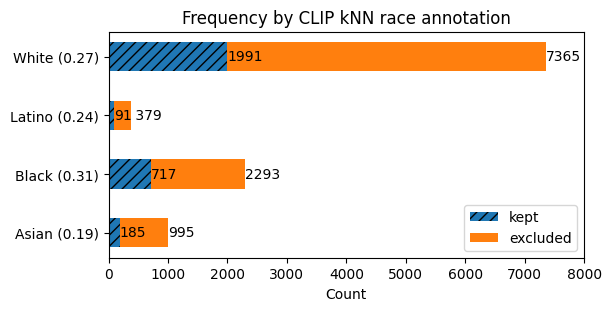

In [108]:
# bar graph: ETHNICITY

graph_results = defaultdict(list)

ratio_by_g = {}
for g in ETHNICITIES:
    total_num = len(ethnicity_count[g]['total'])
    if total_num > 0:
        ratio_by_g[g] = len(ethnicity_count[g]['filtered']) / total_num
    else:
        ratio_by_g[g] = 0
    
    graph_results['kept'].append(len(ethnicity_count[g]['filtered']))
    graph_results['excluded'].append(total_num - len(ethnicity_count[g]['filtered']))

x = np.arange(len(ETHNICITIES))  # the label locations
width = 0.5  # the width of the bars

fig, ax = plt.subplots(layout='constrained', figsize=(6, 3))
bottom = np.zeros(len(x))

for k, v in graph_results.items():
    rects = ax.barh(
        x + width/2, v, height=width, label=k, left=bottom,
        hatch='///' if k == 'kept' else None
    )
    ax.bar_label(rects, fmt=lambda v: str(int(v)) if v != 379 else ' ' + str(int(v))) # , padding=3)
    bottom += v
#     multiplier += 1

# Add some text for labels, title and custom x-axis tick labels, etc.
ax.set_xlabel('Count')
ax.set_xlim(0, 8000)
ax.set_title('Frequency by CLIP kNN race annotation')
ax.set_yticks(x + width/2, ['%s (%.2f)' % (ETHNICITIES_TO_TEXT[g], ratio_by_g[g]) for g in ETHNICITIES])
ax.legend(loc='lower right')

plt.show()

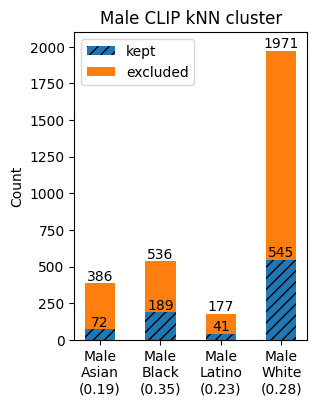

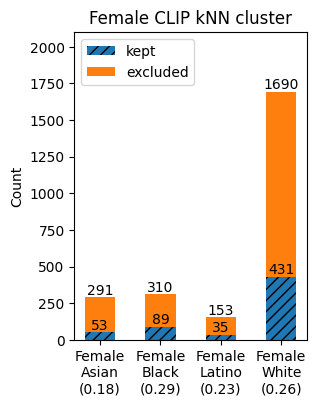

In [109]:
# bar graph: ETHNICITY and GENDER

def show_graph_by_gender(gender):
    graph_results = defaultdict(list)

    ratio_by_g = {}
    for g in ETHNICITIES:
        key = g + gender
        total_num = len(ethnicity_gender_count[key]['total'])
        if total_num > 0:
            ratio_by_g[g] = len(ethnicity_gender_count[key]['filtered']) / total_num
        else:
            ratio_by_g[g] = 0
        
        graph_results['kept'].append(len(ethnicity_gender_count[key]['filtered']))
        graph_results['excluded'].append(total_num - len(ethnicity_gender_count[key]['filtered']))

    x = np.arange(len(ETHNICITIES))  # the label locations
    width = 0.5  # the width of the bars

    fig, ax = plt.subplots(figsize=(3, 4))
    bottom = np.zeros(len(x))
    
    for k, v in graph_results.items():
        offset = width * multiplier
        rects = ax.bar(
            x + width/2, v, width=width, label=k, bottom=bottom,
            hatch='///' if k == 'kept' else None
        )
        ax.bar_label(rects)
        bottom += v

    # Add some text for labels, title and custom x-axis tick labels, etc.
    ax.set_ylabel('Count')
    ax.set_ylim(0, 2100)
    ax.set_title('%s CLIP kNN cluster' % GENDERS_TO_TEXT[gender])
    ax.set_xticks(
        x + width/2,
        ['%s\n%s\n(%.2f)' % (GENDERS_TO_TEXT[gender], ETHNICITIES_TO_TEXT[g], ratio_by_g[g]) for g in ETHNICITIES]
    )
    ax.legend(loc='upper left', ncols=1)

    plt.show()

show_graph_by_gender(GENDERS[0])
show_graph_by_gender(GENDERS[1])

0.027265023204569732
4.637481006818463e-05 0.2290319205774066 0.1651212378967943 0.7545691603462202 0.00013849894924406584


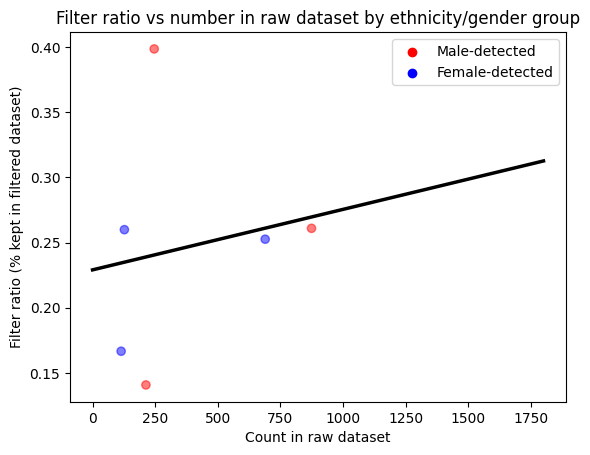

In [403]:
x = []
y = []
dot_colors = []

for g in GENDERS:
    for e in ETHNICITIES:
        key = e + g
        total_num = len(ethnicity_gender_count[key]['total'])
        if total_num > 90:
            ratio = len(ethnicity_gender_count[key]['filtered']) / total_num
            x.append(total_num)
            y.append(ratio)
            if g == 'F':
                dot_colors.append('blue')
            else:
                dot_colors.append('red')

b, a = np.polyfit(x, y, deg=1)
print(np.corrcoef(x, y)[0,1] ** 2)
slope, intercept, r_value, p_value, std_err = scipy.stats.linregress(x, y)
print(slope, intercept, r_value, p_value, std_err)
# Create sequence of 100 numbers from 0 to 100 
xseq = np.linspace(0, 1800, num=100)
# Plot regression line
plt.scatter(x, y, c=dot_colors, alpha=0.5)
plt.plot(xseq, a + b * xseq, color="k", lw=2.5);
plt.xlabel('Count in raw dataset')
plt.ylabel('Filter ratio (% kept in filtered dataset)')
plt.title('Filter ratio vs number in raw dataset by ethnicity/gender group')
plt.scatter([], [], c='red', label='Male-detected')
plt.scatter([], [], c='blue', label='Female-detected')
plt.legend()
plt.show()


## Rekog filter ratio

In [203]:
rekog_uid_to_annotations = {}

rekog_gender_count = {'M': {'filtered': [], 'total': []}, 'F': {'filtered': [], 'total': []}}
# {'Male': {'filtered': X, 'total': X}, 'Female': {'filtered': X, 'total': X}}

for i, uid in enumerate(datacomp_uids_sample):
    is_filtered = uid in filtered_uids
    g = GENDERS[np.argmax(gender_y_rekog[i])]
#         g = GENDERS[np.argmax(gender_y_hat_prob[i])] if confidence_mask[i] else None

    rekog_uid_to_annotations[uid] = g

    if g != None:
        rekog_gender_count[g]['total'].append(uid)
        if is_filtered:
            rekog_gender_count[g]['filtered'].append(uid)

M 0.005565782694230594
F 0.00649419049852767


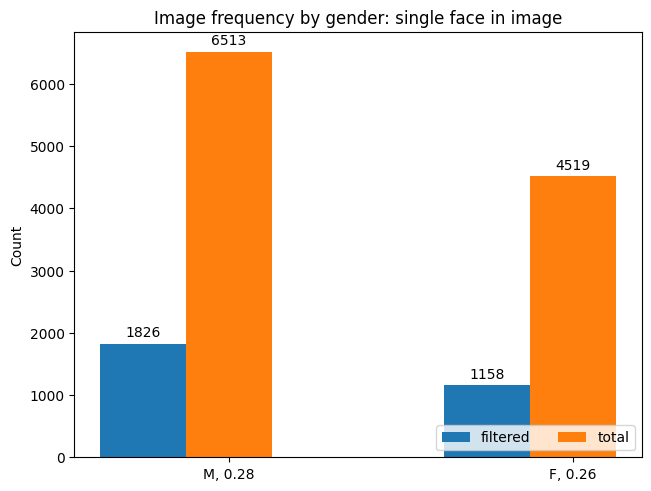

In [204]:
# bar graph: GENDER

graph_results = defaultdict(list)

ratio_by_g = {}
for g in GENDERS:
    filter_num = len(rekog_gender_count[g]['filtered'])
    total_num = len(rekog_gender_count[g]['total'])
    print(g, get_error(filter_num, total_num))
    ratio_by_g[g] = 1.0 * filter_num / total_num
    for k in gender_count[g]:
        graph_results[k].append(len(rekog_gender_count[g][k]))

x = np.arange(len(GENDERS))  # the label locations
width = 0.25  # the width of the bars
multiplier = 0

fig, ax = plt.subplots(layout='constrained')

for k, v in graph_results.items():
    offset = width * multiplier
    rects = ax.bar(x + offset, v, width=width, label=k)
    ax.bar_label(rects, padding=3)
    multiplier += 1

# Add some text for labels, title and custom x-axis tick labels, etc.
ax.set_ylabel('Count')
ax.set_title('Image frequency by gender: single face in image')
ax.set_xticks(x + width, [g + ', %.2f' % ratio_by_g[g] for g in GENDERS])
ax.legend(loc='lower right', ncols=3)

plt.show()

# visualize datacomp clip embedddings on cfd pca

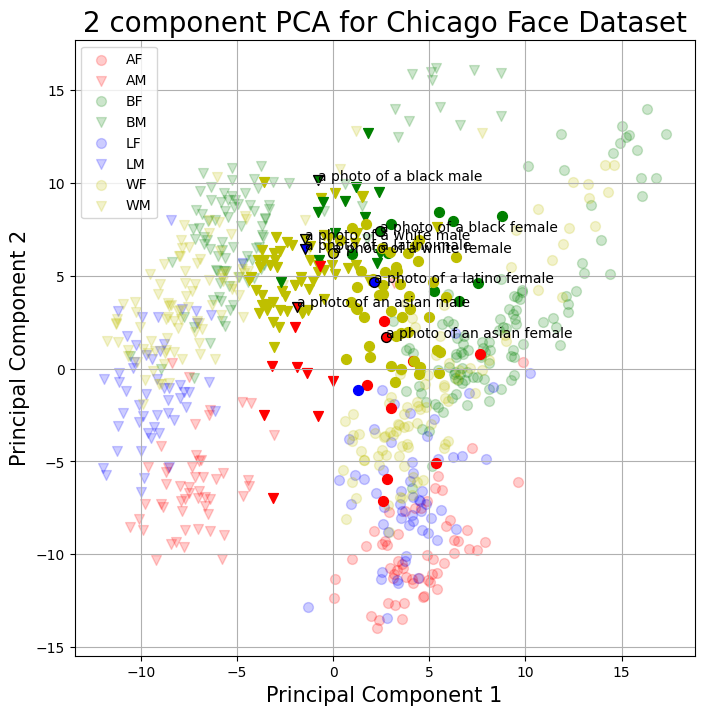

In [126]:
NUM_SAMPLE = 500

datacomp_is = []
datacomp_gs = []
for i, uid in enumerate(datacomp_uids_sample[:NUM_SAMPLE]):
    if g_confidence_mask[i]: # confidence_mask[i] and eth_confidence_mask[i]:
        datacomp_is.append(i)
        e, g = uid_to_annotations[uid]
        datacomp_gs.append(e + g)

datacomp_x = pca_scaler.transform(datacomp_embeddings_sample[datacomp_is])
datacomp_principal_components = pca.transform(datacomp_x)

fig = plt.figure(figsize = (8,8))
ax = fig.add_subplot(1,1,1) 
ax.set_xlabel('Principal Component 1', fontsize = 15)
ax.set_ylabel('Principal Component 2', fontsize = 15)
ax.set_title('2 component PCA for Chicago Face Dataset', fontsize = 20)

targets = sorted(list(set(final_groups)))
colors = {
    'A': 'r',
    'B': 'g',
    'L': 'b',
    'W': 'y'
}
markers = {
    'F': 'o',
    'M': 'v'
}

for i, target in enumerate(targets):
    indicesToKeep = principalDf['group'] == target
    ax.scatter(principalDf.loc[indicesToKeep, 'principal component 1']
               , principalDf.loc[indicesToKeep, 'principal component 2']
               , c = colors[target[0]]
               , marker = markers[target[1]]
               , s = 50
               , alpha = 0.2
    )
ax.legend(targets)
ax.grid()

for g in set(datacomp_gs):
    indicesToKeep = (np.asarray(datacomp_gs) == g)
    ax.scatter(
        datacomp_principal_components[indicesToKeep, 0]
        , datacomp_principal_components[indicesToKeep, 1]
        , c = colors[g[0]]
        , marker = markers[g[1]]
        , s = 50
    )

for i in range(len(text_groups)):
    g = text_groups[i]
    indicesToKeep = principalDf['text_group'] == g
    ax.scatter(principalDf.loc[indicesToKeep, 'principal component 1']
               , principalDf.loc[indicesToKeep, 'principal component 2']
               , c = colors[g.split(' ')[0][0]]
               , marker = markers[g.split(' ')[1][0]]
               , s = 50
               , edgecolors='black'
    )
    ax.text(
        principalDf.loc[indicesToKeep, 'principal component 1'],
        principalDf.loc[indicesToKeep, 'principal component 2'],
        'a photo of a' + ('n ' if g.startswith('A') else ' ') + g.lower()
    )

plt.show()

In [34]:
# can't apply test samples to tSNE so would have to recluster

# datacomp_x = tsne_scaler.transform(datacomp_embeddings_sample)
# datacomp_tsne_results = tsne.transform(datacomp_x)

# fig = plt.figure(figsize = (8,8))
# ax = fig.add_subplot(1,1,1) 
# ax.set_xlabel('tSNE Principal Component 1', fontsize = 15)
# ax.set_ylabel('tSNE Principal Component 2', fontsize = 15)
# ax.set_title('2 component tSNE for Chicago Face Dataset', fontsize = 20)

# targets = sorted(list(set(final_groups)))
# colors = {
#     'A': 'r',
#     'B': 'g',
#     'L': 'b',
#     'W': 'y'
# }
# markers = {
#     'F': 'o',
#     'M': 'v'
# }

# for i, target in enumerate(targets):
#     indicesToKeep = tsneDf['group'] == target
#     ax.scatter(tsneDf.loc[indicesToKeep, 'tsne 1']
#                , tsneDf.loc[indicesToKeep, 'tsne 2']
#                , c = colors[target[0]]
#                , marker = markers[target[1]]
#                , s = 50
#                , alpha = 0.2
#     )
# ax.legend(targets)
# ax.grid()

# ax.scatter(
#     datacomp_tsne_results[:, 0]
#     , datacomp_tsne_results[:, 1]
#     , c = 'black'
#     , s = 50
#     , alpha = 0.2
# )

# plt.show()

AttributeError: 'TSNE' object has no attribute 'transform'

# Threshold

In [188]:
gender_neighbors = 19
eth_neighbors = 5
GENDER_THRESHOLDS = [
    v / gender_neighbors for v in range(1, gender_neighbors + 1)
]
ETH_THRESHOLDS = [
    v / eth_neighbors for v in range(1, eth_neighbors + 1)
]
GENDER_THRESHOLDS, ETH_THRESHOLDS

([0.05263157894736842,
  0.10526315789473684,
  0.15789473684210525,
  0.21052631578947367,
  0.2631578947368421,
  0.3157894736842105,
  0.3684210526315789,
  0.42105263157894735,
  0.47368421052631576,
  0.5263157894736842,
  0.5789473684210527,
  0.631578947368421,
  0.6842105263157895,
  0.7368421052631579,
  0.7894736842105263,
  0.8421052631578947,
  0.8947368421052632,
  0.9473684210526315,
  1.0],
 [0.2, 0.4, 0.6, 0.8, 1.0])

In [189]:
# frequency, filter ratios by threshold
gender_count_by_t = {}

for t in GENDER_THRESHOLDS:
    print(t - 0.01)
    gender_count_by_t[t] = {'M': {'filtered': [], 'total': []}, 'F': {'filtered': [], 'total': []}}
    
    t_gender_conf_mask = [max(row) > t - 0.01 for row in gender_y_hat_prob]
    for i, uid in enumerate(datacomp_uids_sample):
        is_filtered = (uid in filtered_uids)

        if t_gender_conf_mask[i]:
            g = GENDERS[np.argmax(gender_y_hat_prob[i])]
#             g = GROUPS[np.argmax(g_y_hat_prob[i])][1]
            gender_count_by_t[t][g]['total'].append(uid)
            if is_filtered:
                gender_count_by_t[t][g]['filtered'].append(uid)

0.042631578947368416
0.09526315789473684
0.14789473684210525
0.20052631578947366
0.2531578947368421
0.3057894736842105
0.3584210526315789
0.41105263157894734
0.46368421052631575
0.5163157894736842
0.5689473684210526
0.621578947368421
0.6742105263157895
0.7268421052631578
0.7794736842105263
0.8321052631578947
0.8847368421052632
0.9373684210526315
0.99


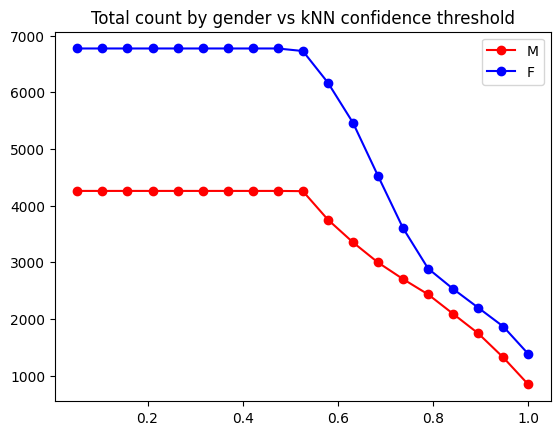

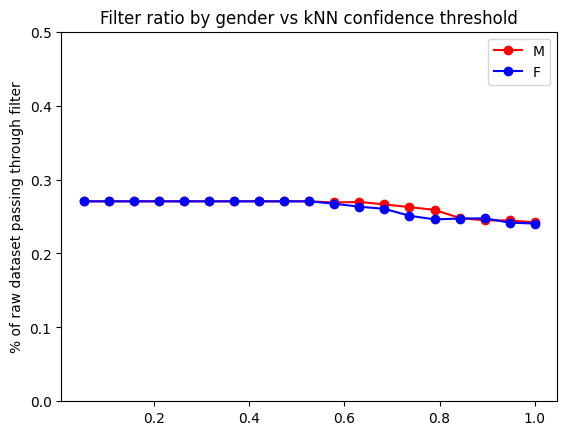

In [190]:
for g in GENDERS:
    total_by_t = [len(gender_count_by_t[t][g]['total']) for t in GENDER_THRESHOLDS]
    plt.plot(GENDER_THRESHOLDS, total_by_t, '-o', c='blue' if g == 'F' else 'r', label=g)
plt.legend()
plt.title('Total count by gender vs kNN confidence threshold')
plt.show()

for g in GENDERS:
    total_by_t = [
        len(gender_count_by_t[t][g]['filtered']) / len(gender_count_by_t[t][g]['total']) \
            for t in GENDER_THRESHOLDS
    ]
    plt.plot(GENDER_THRESHOLDS, total_by_t, '-o', c='blue' if g == 'F' else 'r', label=g)
plt.legend()
plt.ylim(0, 0.5)
plt.ylabel('% of raw dataset passing through filter')
plt.title('Filter ratio by gender vs kNN confidence threshold')
plt.show()

In [95]:
# frequency, filter ratios by threshold
eth_count_by_t = {}

for t in ETH_THRESHOLDS:
    print(t - 0.01)
    eth_count_by_t[t] = {}
    for e in ETHNICITIES:
        eth_count_by_t[t][e] = {'filtered': [], 'total': []}
    
    t_eth_conf_mask = [max(row) > t - 0.01 for row in eth_y_hat_prob]
    for i, uid in enumerate(datacomp_uids_sample):
        is_filtered = (uid in filtered_uids)

        if t_eth_conf_mask[i]:
            e = ETHNICITIES[np.argmax(eth_y_hat_prob[i])][0]
#             e = GROUPS[np.argmax(g_y_hat_prob[i])][0]
            eth_count_by_t[t][e]['total'].append(uid)
            if is_filtered:
                eth_count_by_t[t][e]['filtered'].append(uid)

0.19
0.39
0.59
0.79
0.99


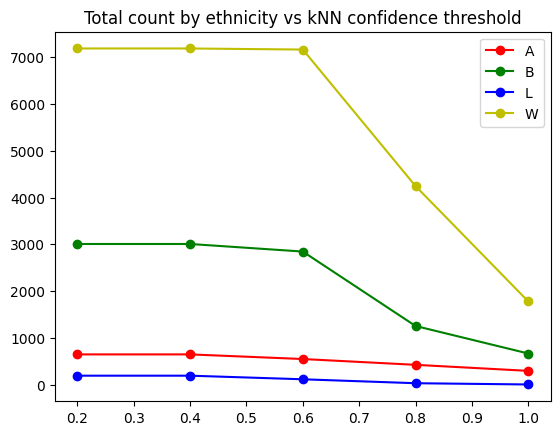

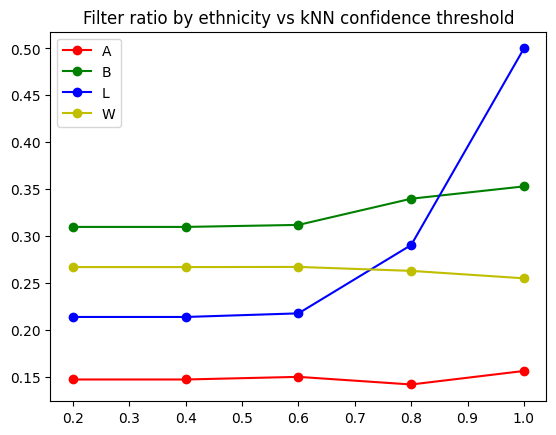

In [96]:
for g in ETHNICITIES:
    total_by_t = [len(eth_count_by_t[t][g]['total']) for t in ETH_THRESHOLDS]
    plt.plot(ETH_THRESHOLDS, total_by_t, '-o', c=colors[g], label=g)
plt.legend()
plt.title('Total count by ethnicity vs kNN confidence threshold')
plt.show()

for g in ETHNICITIES:
    total_by_t = [
        len(eth_count_by_t[t][g]['filtered']) / len(eth_count_by_t[t][g]['total']) \
            if len(eth_count_by_t[t][g]['total']) > 0 else 0 \
            for t in ETH_THRESHOLDS
    ]
    plt.plot(ETH_THRESHOLDS, total_by_t, '-o', c=colors[g], label=g)
plt.legend()
plt.title('Filter ratio by ethnicity vs kNN confidence threshold')
plt.show()

libpng warning: iCCP: known incorrect sRGB profile


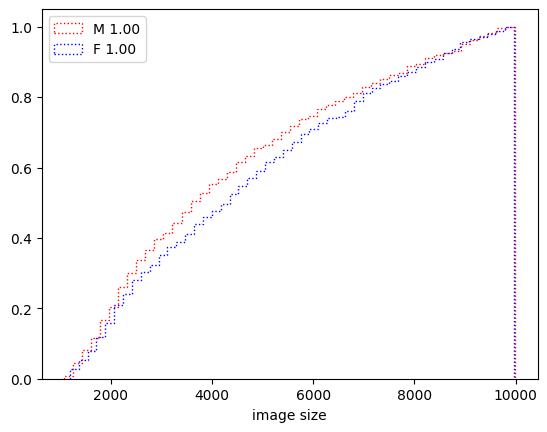

In [117]:
# image size (area)
N_SAMPLE = 1000

line_styles = [
    'dotted', 'dashed', 'solid'
]
for i, t in enumerate(GENDER_THRESHOLDS[-1:]):
    for g in gender_count_by_t[t]:
        g_uids = gender_count_by_t[t][g]['total']
        
        img_sizes = []
        for uid in (random.sample(g_uids, N_SAMPLE) if len(g_uids) > N_SAMPLE else g_uids):
            img_size = get_face_img_size(uid, opencv=True)
            if img_size < 10**4:
                img_sizes.append(img_size)

#         ax.ecdf(img_sizes, '%s %.2f' % (g, t))
        plt.hist(
            img_sizes,
            50,
            label = '%s %.2f' % (g, t),
            density=True,
            cumulative=True,
            color='blue' if g == 'F' else 'r', # colors[g],
            linestyle=(line_styles[i]),
            histtype='step'
        )
    break
plt.xlabel('image size')
plt.legend()
plt.show()
        

# Rekognition agreement vs image size

In [110]:
img_sizes = []
rekog_agreement = []

for i, uid in enumerate(datacomp_uids_sample):
    if confidence_mask[i]:
        g = gender_y_hat_prob[i]
        g_rekog = gender_y_rekog[i]
        int_agree = int(GENDERS[np.argmax(g)] == GENDERS[np.argmax(g_rekog)])
        rekog_agreement.append(int_agree)
        
        img_size = get_face_img_size(uid, opencv=False)
        img_sizes.append(img_size)

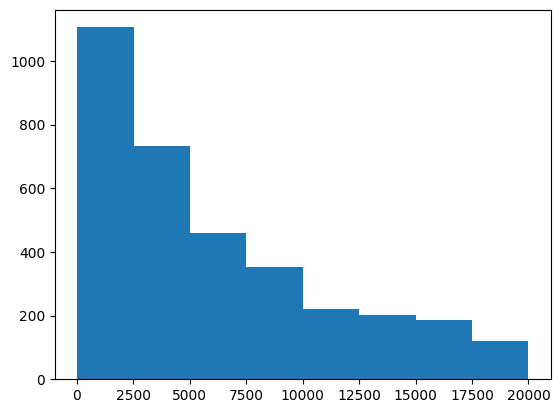

In [113]:
img_sizes = np.asarray(img_sizes)
rekog_agreement = np.asarray(rekog_agreement)

size_cap = (img_sizes < 20000)
y = img_sizes[size_cap]
_, bins, patches = plt.hist(y, bins=8)

0.03317278795220313
6.355232046435412e-07 0.9611218009109124 0.1821339835181868 0.44216446009677235 8.086835451119528e-07


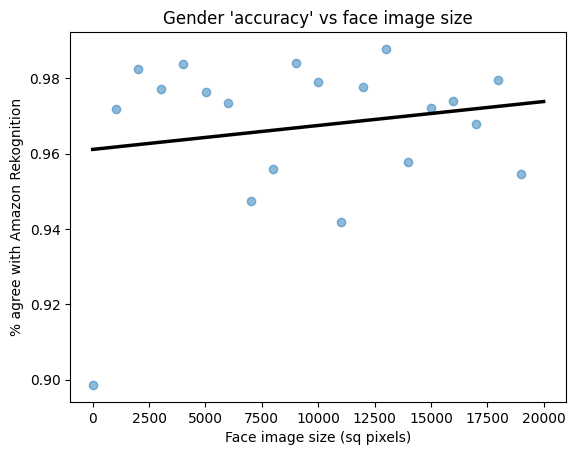

In [114]:
a = img_sizes[size_cap]
b = rekog_agreement[size_cap]
bins = np.linspace(a.min(), a.max() + 1e-12, 21) # 10 bins, so 11 bin boundaries
c = np.digitize(a, bins)

x = bins[:-1]
y = [np.mean(b[c == i]) for i in range(1, len(bins))]

b, a = np.polyfit(x, y, deg=1)
print(np.corrcoef(x, y)[0,1] ** 2)
slope, intercept, r_value, p_value, std_err = scipy.stats.linregress(x, y)
print(slope, intercept, r_value, p_value, std_err)
# Create sequence of 100 numbers from 0 to 100 
xseq = np.linspace(0, 20000, num=100)

# Plot regression line
plt.scatter(x, y, alpha=0.5)
plt.plot(xseq, a + b * xseq, color="k", lw=2.5);
plt.xlabel('Face image size (sq pixels)')
plt.ylabel('% agree with Amazon Rekognition')
# plt.ylim(0, 1)
plt.title("Gender 'accuracy' vs face image size")
plt.show()

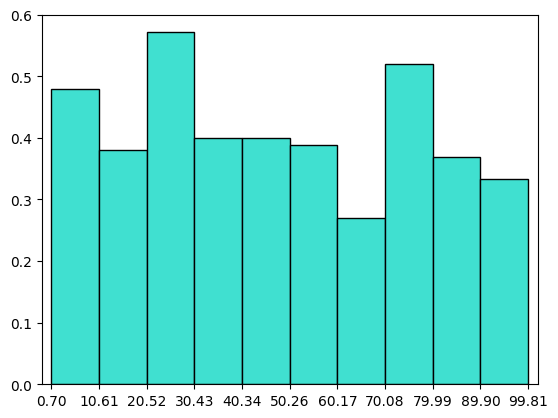

In [621]:
a = np.random.uniform(0, 100, 200)
b = np.random.randint(0, 2, 200)
bins = np.linspace(a.min(), a.max() + 1e-12, 11) # 10 bins, so 11 bin boundaries
c = np.digitize(a, bins)
plt.bar(bins[:-1], [np.mean(b[c == i]) for i in range(1, len(bins))],
        width=bins[1] - bins[0], align='edge', fc='turquoise', ec='black')
plt.xticks(bins)
plt.margins(x=0.02) # smaller margins
plt.show()

# Linear regression: CLIP similarity score vs y_hat_prob

In [212]:
from sklearn import datasets, linear_model
from sklearn.linear_model import LinearRegression
import statsmodels.api as sm
from scipy import stats

diabetes = datasets.load_diabetes()
X = diabetes.data
y = diabetes.target

X2 = sm.add_constant(X)
est = sm.OLS(y, X2)
est2 = est.fit()
print(est2.summary())

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.518
Model:                            OLS   Adj. R-squared:                  0.507
Method:                 Least Squares   F-statistic:                     46.27
Date:                Wed, 06 Mar 2024   Prob (F-statistic):           3.83e-62
Time:                        14:25:47   Log-Likelihood:                -2386.0
No. Observations:                 442   AIC:                             4794.
Df Residuals:                     431   BIC:                             4839.
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const        152.1335      2.576     59.061      0.0

In [214]:
X.shape, y.shape

((442, 10), (442,))

In [237]:
features = []
scores = []
for i, uid in enumerate(datacomp_uids_sample):
    scores.append(uid_to_score[uid])
    x = np.concatenate(([gender_y_hat_prob[i][0]], eth_y_hat_prob[i][:3]))
    # omitted: F, W
#     print(x.shape)
#     raise Exception
    features.append(list(x))
scores = np.asarray(scores)
features = np.asarray(features)
scores.shape, features.shape

x_df = pd.DataFrame(data=features, columns=["male_prob", "asian_prob", "black_prob", "latino_prob"])
x_df

,male_prob,asian_prob,black_prob,latino_prob
0,0.818182,0.181818,0.727273,0.000000
1,0.363636,0.000000,0.272727,0.000000
2,0.000000,0.090909,0.090909,0.181818
3,0.727273,0.000000,1.000000,0.000000
4,0.000000,0.000000,0.000000,0.000000
...,...,...,...,...
60708,0.000000,0.000000,0.181818,0.000000
60709,0.272727,0.000000,0.363636,0.000000
60710,0.818182,0.000000,0.181818,0.181818
60711,1.000000,0.000000,0.000000,0.181818


In [238]:
features_2 = sm.add_constant(x_df)
est = sm.OLS(scores, features_2)
est2 = est.fit()
print(est2.summary())

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.005
Model:                            OLS   Adj. R-squared:                  0.005
Method:                 Least Squares   F-statistic:                     76.72
Date:                Wed, 06 Mar 2024   Prob (F-statistic):           5.22e-65
Time:                        14:48:25   Log-Likelihood:                 81561.
No. Observations:               60713   AIC:                        -1.631e+05
Df Residuals:                   60708   BIC:                        -1.631e+05
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
                  coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------
const           0.1973      0.001    345.550      